<a href="https://colab.research.google.com/github/chrispinciza01/ccn-model/blob/main/CCN_IDs_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [1]:
# Import necessary libraries
import numpy as np  # For numerical operations
import pandas as pd  # For data processing
import os  # Operating system interactions
import re  # Regular expressions
import time  # Time-related operations
import math  # Mathematical functions
import tqdm  # Progress bar visualization
import itertools  # Iteration tools
import matplotlib.pyplot as plt  # Plotting library
import seaborn as sns  # Data visualization
import plotly.express as px  # Interactive plotting
import plotly.offline as pyo  # Plot rendering
# Import scikit-learn modules
from sklearn.model_selection import train_test_split  # Splitting data into training and testing sets
from sklearn.preprocessing import MinMaxScaler  # Feature scaling
from sklearn.preprocessing import LabelEncoder  # Label encoding
from sklearn.neural_network import MLPClassifier  # Multi-layer Perceptron classifier
# Import Keras modules
import keras  # Deep learning library
from keras.models import Model  # For creating Keras models
from keras.layers import Conv2D, Conv1D, MaxPooling2D, MaxPooling1D, Flatten, BatchNormalization, Dense  # Neural network layers
from keras.layers import Input, Dense, LSTM, BatchNormalization  # Different types of neural network layers
from keras.utils import to_categorical  # Convert to one-hot encoding
from keras.models import Sequential  # Sequential model architecture
from keras.optimizers import Adam  # Optimizer for training the model
from keras.callbacks import CSVLogger, ModelCheckpoint  # Callbacks for model training and logging
# Mount Google Drive in Google Colab
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Loading the Data

In [2]:
Network_data=pd.read_csv('/content/drive/MyDrive/dataset /CSE-CIC-IDS2018/02-23-2018.csv')
Network_data.describe()

,Dst Port,Protocol,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,Fwd Pkt Len Mean,...,Fwd Act Data Pkts,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,...,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,9.348696e+03,8.975475e+00,1.872781e+07,6.973433e+00,9.927304e+00,4.139611e+02,9.754156e+03,1.829207e+02,1.238202e+01,4.556939e+01,...,2.223984e+00,1.640559e+01,7.418233e+04,3.906540e+04,1.352481e+05,5.029775e+04,9.651403e+06,1.361818e+05,9.767623e+06,9.513826e+06
std,1.843987e+04,5.043780e+00,3.633651e+07,1.208786e+02,3.130818e+02,2.152351e+03,4.400548e+05,2.760979e+02,2.864373e+01,5.596788e+01,...,4.366489e+00,5.843276e+00,8.559987e+05,5.136679e+05,1.279458e+06,7.272785e+05,2.499512e+07,1.589312e+06,2.511830e+07,2.495002e+07
min,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,5.300000e+01,6.000000e+00,5.120000e+02,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,8.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,4.430000e+02,6.000000e+00,9.511800e+04,2.000000e+00,1.000000e+00,4.500000e+01,1.010000e+02,4.100000e+01,0.000000e+00,3.600000e+01,...,0.000000e+00,2.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,3.389000e+03,1.700000e+01,5.284498e+06,8.000000e+00,7.000000e+00,4.550000e+02,6.995000e+02,1.960000e+02,3.100000e+01,5.685197e+01,...,4.000000e+00,2.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,6.553400e+04,1.700000e+01,1.200000e+08,5.809100e+04,1.231180e+05,1.582330e+06,1.563604e+08,6.592000e+03,1.449000e+03,1.809552e+03,...,1.088000e+03,4.800000e+01,1.131706e+08,6.950474e+07,1.131706e+08,1.131706e+08,1.199916e+08,7.157844e+07,1.199916e+08,1.199916e+08


# EDA (Exploratory Data Analysis)
To better understand the dataset we are working with, we will conduct a brief Exploratory Data Analysis (EDA). The EDA is divided into two parts: Data Visualization and Data Understanding.

# Understanding


In [3]:
# check the number of rows and columns(shape of the Data)
print('Number of Rows (Samples): %s' % str((Network_data.shape[0])))
print('Number of Columns (Features): %s' % str((Network_data.shape[1])))

Number of Rows (Samples): 1048575
Number of Columns (Features): 80


In [4]:
# check the columns in data
Network_data.columns

Index(['Dst Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Tot Fwd Pkts',
       'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max',
       'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std',
       'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean',
       'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean',
       'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
       'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min',
       'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
       'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags',
       'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s',
       'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean',
       'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt',
       'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt',
       'CWE Flag Count', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg',
      

In [5]:
# check the number of values for labels
Network_data['Label'].value_counts()

Benign              1048009
Brute Force -Web        362
Brute Force -XSS        151
SQL Injection            53
Name: Label, dtype: int64

# Data Visualizations

In [6]:
import plotly.express as px

# Create a bar plot using Plotly Express with custom colors
fig = px.bar(x=Network_data["Label"][:9000].value_counts().index,
             y=Network_data["Label"][:9000].value_counts().values,
             title="Bar Plot of Attack Types",
             labels={"x": "Type of Attacks", "y": "Number of Attacks"},
             color=Network_data["Label"][:9000].value_counts().index)

# Show the bar plot
fig.show()

CPU times: user 1.16 s, sys: 45.5 ms, total: 1.2 s
Wall time: 1.17 s


<Axes: xlabel='Bwd Pkts/s', ylabel='Fwd Seg Size Min'>

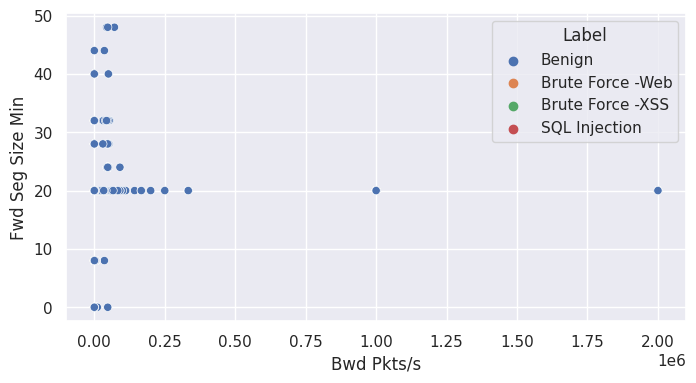

In [7]:
%%time
sns.set(rc={'figure.figsize':(8, 4)})
sns.scatterplot(x=Network_data['Bwd Pkts/s'][:50000], y=Network_data['Fwd Seg Size Min'][:50000],
                hue='Label', data=Network_data)

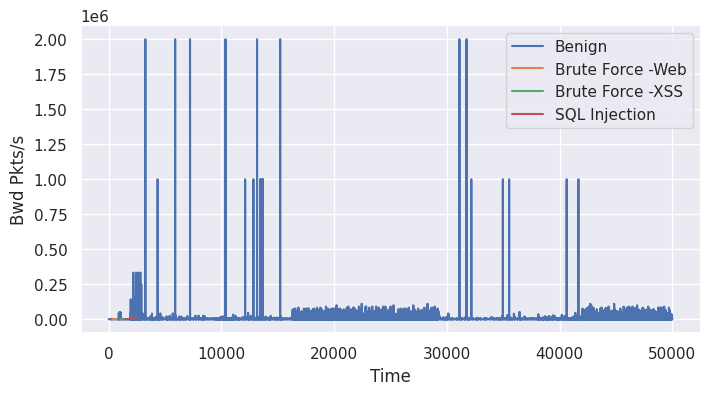

In [8]:
# Set the figure size for the plot
sns.set(rc={'figure.figsize': (8, 4)})

# Create a time series plot using Seaborn
# Note: This example assumes that your data has a time-related index or column
sns.lineplot(x=Network_data.index[:1048575],  # Assuming 'index' is the time-related index
             y=Network_data['Bwd Pkts/s'][:50000],
             hue='Label', data=Network_data)

# Add labels to the axes
plt.xlabel('Time')
plt.ylabel('Bwd Pkts/s')

# Display a legend
plt.legend()

# Show the plot
plt.show()


In [9]:
import plotly.express as px

# Create a box plot using Plotly Express to visualize outliers
fig = px.box(Network_data, x="Label", title="Box Plot of Attack Types",
             labels={"x": "Type of Attacks", "y": "Number of Attacks"},
             color="Label")

# Show the box plot
fig.show()

# Data Preprocessing¶
Data preprocessing is a crucial step in data science because data may not always be clean and may contain missing or null values. In this step, we will perform several preprocessing steps to help us identify and handle any null or missing values in our data. Is there anything else you would like to know?

In [10]:
# check for some null or missing values in our dataset

Network_data.isnull().sum().to_numpy()

array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0, 3754,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0])

All of the features in the data are complete, with no missing or null values, except for one feature that has 2277 missing values. To clean our data, we need to remove this column.

In [11]:
# drop null or missing columns
cleaned_data = Network_data.dropna()
cleaned_data.isna().sum().to_numpy()

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

# Label Encoding¶
The data's "Label" attribute comprises three categories: Benign, BruteForceFTP, and BruteForceSSH. These categories are represented as strings. To make them compatible with our neural network, we must transform them into numerical values, enabling our neural network to comprehend their encoded representations.

In [12]:
# Import the necessary library
from sklearn.preprocessing import LabelEncoder

# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Use LabelEncoder to transform the "Label" column
cleaned_data['Label'] = label_encoder.fit_transform(cleaned_data['Label'])

# Display the unique encoded values
unique_encoded_values = cleaned_data['Label'].unique()
print(unique_encoded_values)

[0 1 2 3]


<ipython-input-12-be7ddfb7ea22>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [13]:
# check for Encoded labels
cleaned_data['Label'].value_counts()

0    1044255
1        362
2        151
3         53
Name: Label, dtype: int64

# Shaping the data for CNN
To employ both a convolutional neural network (CNN) and recurrent neural network (RNN) on our dataset, the ensuing sequence of actions needs to be taken:

Divide the data into distinct sets for each label category.
Develop a numerical matrix depiction to represent the labels.
Implement resampling on the data to ensure an equitable distribution across all label categories.
Establish predictor (X) and target (Y) variables.
Partition the data into training and testing subsets.
Transform the data into a multi-dimensional format suitable for the application of CNN and RNN architectures.

In [14]:
# Separate the dataset into three distinct components based on label categories
data_benign = cleaned_data[cleaned_data['Label'] == 0]
data_bruteforce_web = cleaned_data[cleaned_data['Label'] == 1]
data_bruteforce_xss = cleaned_data[cleaned_data['Label'] == 2]
data_sql_injection = cleaned_data[cleaned_data['Label'] == 3]

# Create the target labels for each category
y_benign = np.zeros(data_benign.shape[0])
y_bf_web = np.ones(data_bruteforce_web.shape[0])
y_bf_xss = np.full(data_bruteforce_xss.shape[0], 2)
y_sql = np.full(data_sql_injection.shape[0], 3)

# Create dataframes for the target labels
y_benign_df = pd.DataFrame(y_benign)
y_bf_web_df = pd.DataFrame(y_bf_web)
y_bf_xss_df = pd.DataFrame(y_bf_xss)
y_sql_df = pd.DataFrame(y_sql)

# Concatenate the dataframes for target labels
y = pd.concat([y_benign_df, y_bf_web_df, y_bf_xss_df, y_sql_df], sort=True)

# Concatenate the dataframes for features
X = pd.concat([data_benign, data_bruteforce_web, data_bruteforce_xss, data_sql_injection], sort=True)


In [15]:
y_benign, y_bf_web, y_bf_xss, y_sql

(array([0., 0., 0., ..., 0., 0., 0.]),
 array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1

# Data Argumentation¶
To mitigate bias in the data and achieve a balanced distribution, employ data augmentation techniques. These techniques involve creating new instances by applying various transformations to existing data points. By doing so, we can effectively counteract the imbalance in the dataset. This not only enhances model performance but also reduces bias-related issues in training.

In [16]:
from sklearn.utils import resample

# Define the desired number of samples for resampling
desired_samples = 20000

# Perform resampling for each category
data_1_resample = resample(data_benign, n_samples=desired_samples,
                           random_state=123, replace=True)
data_2_resample = resample(data_bruteforce_web, n_samples=desired_samples,
                           random_state=123, replace=True)
data_3_resample = resample(data_bruteforce_xss, n_samples=desired_samples,
                           random_state=123, replace=True)
data_4_resample = resample(data_sql_injection, n_samples=desired_samples,
                           random_state=123, replace=True)


In [17]:
train_dataset = pd.concat([data_1_resample, data_2_resample, data_3_resample, data_4_resample])
train_dataset.head(5)

,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
777033,3389,6,23/02/2018 04:59:47,4898616,14,8,1437,1731,725,0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
279501,443,6,23/02/2018 04:42:09,51,1,2,58,31,58,58,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
28666,7288,6,23/02/2018 04:52:17,86129029,2,0,0,0,0,0,...,20,0.0,0.0,0,0,86129029.0,0.0,86129029,86129029,0
18350,53,17,23/02/2018 10:17:12,2265,1,1,30,132,30,30,...,8,0.0,0.0,0,0,0.0,0.0,0,0,0
193781,3389,6,23/02/2018 02:03:49,1718256,9,7,1148,1581,677,0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0


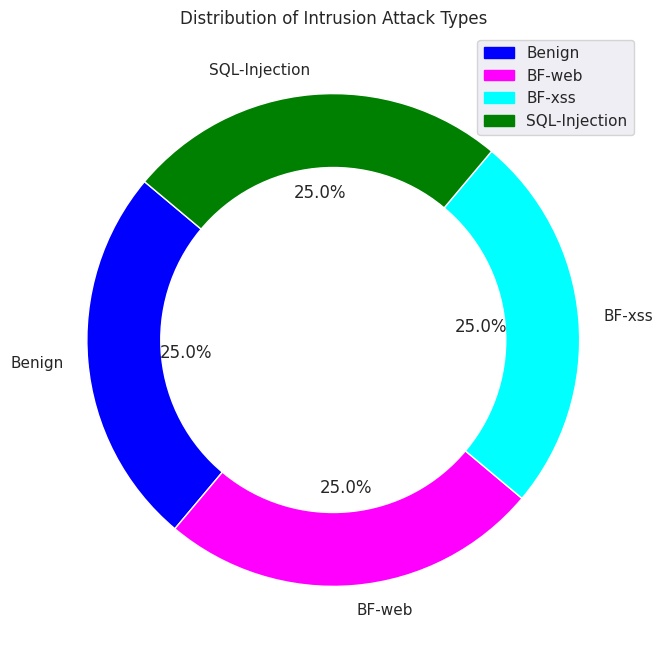

In [18]:
from matplotlib.patches import Patch

# Set up the figure and axes
plt.figure(figsize=(10, 8))

# Create a white circle at the center for a donut chart appearance
circle = plt.Circle((0, 0), 0.7, color='white')

# Set the title for the plot
plt.title('Distribution of Intrusion Attack Types')

# Create a pie chart to visualize attack type distribution
colors = ['blue', 'magenta', 'cyan', 'green']
labels = ['Benign', 'BF-web', 'BF-xss', 'SQL-Injection']
plt.pie(train_dataset['Label'].value_counts(), labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)

# Add the white circle to create a donut chart effect
p = plt.gcf()
p.gca().add_artist(circle)

# Create legend with custom color patches
legend_handles = [Patch(color=color, label=label) for color, label in zip(colors, labels)]
plt.legend(handles=legend_handles)

# Show the plot
plt.show()


# Making X & Y Variables
Creating X and Y variables is an essential preprocessing step in supervised learning, as it establishes the relationship between input data (X) and corresponding target labels or outputs (Y), enabling model training and pattern discovery.

In [19]:
# Splitting the dataset for RNN and CNN into training and testing subsets
test_fraction = 0.1  # Fraction of data for testing

# Create a test dataset by randomly selecting a fraction from the training dataset
test_dataset = train_dataset.sample(frac=test_fraction, random_state=42)

# Extracting target labels for training and testing
target_train = train_dataset['Label']
target_test = test_dataset['Label']

# Display unique target labels for training and testing
unique_labels_train = target_train.unique()
unique_labels_test = target_test.unique()

# Print the unique labels for training and testing subsets
print("Unique labels in training dataset:", unique_labels_train)
print("Unique labels in test dataset:", unique_labels_test)


Unique labels in training dataset: [0 1 2 3]
Unique labels in test dataset: [2 3 0 1]


In [20]:
# Convert training and testing target labels to one-hot encoded format
y_train = to_categorical(target_train, num_classes=4)
y_test = to_categorical(target_test, num_classes=4)

# Data Splicing¶
In this phase, the data is divided into two separate sets: the training set and the testing set. The training set serves as the input for training the model, while the testing set is employed to evaluate the model's performance on new, unseen data. The data is split using an 80-20 ratio, implying that 80% of the data is allocated for training, and the remaining 20% is reserved for testing purposes.

In [21]:
train_dataset = train_dataset.drop(columns = ["Timestamp", "Protocol","PSH Flag Cnt","Init Fwd Win Byts","Flow Byts/s","Flow Pkts/s", "Label"], axis=1)
test_dataset = test_dataset.drop(columns = ["Timestamp", "Protocol","PSH Flag Cnt","Init Fwd Win Byts","Flow Byts/s","Flow Pkts/s", "Label"], axis=1)

In [22]:
# Extracting Features from Train and Test Data
X_train = train_dataset.iloc[:, :-1].values
X_test = test_dataset.iloc[:, :-1].values

# Displaying Test Data Examples
print("Examples in X_test:")
print(X_test)

# Displaying Train Data Examples
print("\nExamples in X_train:")
print(X_train)


Examples in X_test:
[[8.0000000e+01 7.8000000e+01 2.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [8.0000000e+01 5.7252181e+07 2.0300000e+02 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [8.0000000e+01 5.0052460e+06 3.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 ...
 [3.3890000e+03 4.0993790e+06 1.3000000e+01 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [8.0000000e+01 5.6368081e+07 1.5300000e+02 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [8.0000000e+01 2.3081627e+07 8.3000000e+01 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]

Examples in X_train:
[[3.3890000e+03 4.8986160e+06 1.4000000e+01 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [4.4300000e+02 5.1000000e+01 1.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [7.2880000e+03 8.6129029e+07 2.0000000e+00 ... 8.6129029e+07
  0.0000000e+00 8.6129029e+07]
 ...
 [8.0000000e+01 5.0106410e+06 4.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [8.0000000e+01 5

In [23]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(80000, 72)
(8000, 72)
(80000, 4)
(8000, 4)


In [24]:
# Reshaping Data for CNN and RNN
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

# Displaying Shapes of Reshaped Data
print("Shape of X_train_reshaped:", X_train.shape)
print("Shape of X_test_reshaped:", X_test.shape)


Shape of X_train_reshaped: (80000, 72, 1)
Shape of X_test_reshaped: (8000, 72, 1)


# CONVOLUTIONAL NEURAL NETWORK (CNN)

In [25]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, BatchNormalization
from sklearn.metrics import confusion_matrix
import keras.backend as K
import numpy as np

# Custom Metrics Definitions
def compute_confusion_matrix(y_true, y_pred):
    return confusion_matrix(K.argmax(y_true, axis=-1), K.argmax(y_pred, axis=-1))

def false_positive_rate(y_true, y_pred):
    cm = compute_confusion_matrix(y_true, y_pred)
    fp = cm.sum(axis=0) - np.diag(cm)
    fp_rate = fp / cm.sum(axis=0)
    return K.mean(fp_rate)

def false_negative_rate(y_true, y_pred):
    cm = compute_confusion_matrix(y_true, y_pred)
    fn = cm.sum(axis=1) - np.diag(cm)
    fn_rate = fn / cm.sum(axis=1)
    return K.mean(fn_rate)

def precision(y_true, y_pred):
    cm = compute_confusion_matrix(y_true, y_pred)
    precision = np.diag(cm) / cm.sum(axis=0)
    return K.mean(precision)

def recall(y_true, y_pred):
    cm = compute_confusion_matrix(y_true, y_pred)
    recall = np.diag(cm) / cm.sum(axis=1)
    return K.mean(recall)

def f1_score(y_true, y_pred):
    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * ((p * r) / (p + r + K.epsilon()))

# Creating the Deep Learning Model
def ccn_create_model():
    model = Sequential()

    # CNN Layer 1
    model.add(Conv1D(filters=64, kernel_size=6, activation='relu',
                     padding='same', input_shape=(72, 1)))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=4, strides=2, padding='same'))

    # CNN Layer 2
    model.add(Conv1D(filters=64, kernel_size=6, activation='relu',
                     padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=4, strides=2, padding='same'))

    # CNN Layer 3
    model.add(Conv1D(filters=64, kernel_size=6, activation='relu',
                     padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=4, strides=2, padding='same'))

    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(4, activation='softmax'))

    model.compile(loss='categorical_crossentropy', optimizer='adam',
                  metrics=['accuracy'])

    return model

# Creating an instance of the model
cnn_model = ccn_create_model()



In [26]:
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 72, 64)            448       
                                                                 
 batch_normalization (Batch  (None, 72, 64)            256       
 Normalization)                                                  
                                                                 
 max_pooling1d (MaxPooling1  (None, 36, 64)            0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 36, 64)            24640     
                                                                 
 batch_normalization_1 (Bat  (None, 36, 64)            256       
 chNormalization)                                                
                                                        

In [27]:
from keras.callbacks import CSVLogger

# Create a CSV Logger
csv_logger = CSVLogger('training_logs.csv', append=True)

# Training the CNN Model
history = cnn_model.fit(X_train, y_train, epochs=100, batch_size=32,
                        validation_data=(X_test, y_test), callbacks=[csv_logger])


Epoch 1/100
2500/2500 [==============================] - 30s 7ms/step - loss: 0.4784 - accuracy: 0.8030 - val_loss: 0.4388 - val_accuracy: 0.7961
Epoch 2/100
2500/2500 [==============================] - 17s 7ms/step - loss: 0.3861 - accuracy: 0.8452 - val_loss: 0.3804 - val_accuracy: 0.8506
Epoch 3/100
2500/2500 [==============================] - 18s 7ms/step - loss: 0.3602 - accuracy: 0.8528 - val_loss: 0.9633 - val_accuracy: 0.7513
Epoch 4/100
2500/2500 [==============================] - 17s 7ms/step - loss: 0.3504 - accuracy: 0.8576 - val_loss: 0.4179 - val_accuracy: 0.8357
Epoch 5/100
2500/2500 [==============================] - 16s 7ms/step - loss: 0.3656 - accuracy: 0.8426 - val_loss: 0.3545 - val_accuracy: 0.8453
Epoch 6/100
2500/2500 [==============================] - 17s 7ms/step - loss: 0.3582 - accuracy: 0.8471 - val_loss: 0.3573 - val_accuracy: 0.8403
Epoch 7/100
2500/2500 [==============================] - 17s 7ms/step - loss: 0.3906 - accuracy: 0.8408 - val_loss: 3.2406 -

# Visualization of Results (CNN)¶
Let's make a graphical visualization of results obtained by applying CNN to our data.

In [28]:
# check the model performance on test data
from sklearn.metrics import confusion_matrix

# Calculate predictions
y_pred = cnn_model.predict(X_test)
y_pred_argmax = np.argmax(y_pred, axis=1)
y_test_argmax = np.argmax(y_test, axis=1)

# Calculate confusion matrix
cm = confusion_matrix(y_test_argmax, y_pred_argmax)

# Calculate False Positive Rate (FPR) and False Negative Rate (FNR)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
fp_rate = (fp / cm.sum(axis=0)) * 100
fn_rate = (fn / cm.sum(axis=1)) * 100

# Calculate accuracy
accuracy = cnn_model.evaluate(X_test, y_test)

# Display Accuracy, False Positive Rate (FPR), and False Negative Rate (FNR)
print("%s: %.2f%%" % (cnn_model.metrics_names[1], accuracy[1] * 100))
for class_idx in range(len(fp_rate)):
    print(f"Class {class_idx}: FPR = {fp_rate[class_idx]:.2f}%, FNR = {fn_rate[class_idx]:.2f}%")

250/250 [==============================] - 1s 3ms/step - loss: 0.1748 - accuracy: 0.9250
accuracy: 92.50%
Class 0: FPR = 0.64%, FNR = 4.93%
Class 1: FPR = 13.22%, FNR = 12.23%
Class 2: FPR = 7.38%, FNR = 10.83%
Class 3: FPR = 8.10%, FNR = 1.89%


In [29]:
import numpy as np
import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Assuming you have already computed y_pred and y_test

# Calculate Precision, Recall, and F1-Score
y_pred_argmax = np.argmax(y_pred, axis=1)
y_test_argmax = np.argmax(y_test, axis=1)

precision = precision_score(y_test_argmax, y_pred_argmax, average='weighted') * 100
recall = recall_score(y_test_argmax, y_pred_argmax, average='weighted') * 100
f1 = f1_score(y_test_argmax, y_pred_argmax, average='weighted') * 100

# Calculate Accuracy
accuracy = accuracy_score(y_test_argmax, y_pred_argmax) * 100

# Create a DataFrame
metrics_data = {'Metric': ['Precision', 'Recall', 'F1-Score', 'Accuracy'],
                'Value': [f'{precision:.2f}%', f'{recall:.2f}%', f'{f1:.2f}%', f'{accuracy:.2f}%']}

metrics_df = pd.DataFrame(metrics_data)

# Display the DataFrame
metrics_df


,Metric,Value
0,Precision,92.60%
1,Recall,92.50%
2,F1-Score,92.50%
3,Accuracy,92.50%


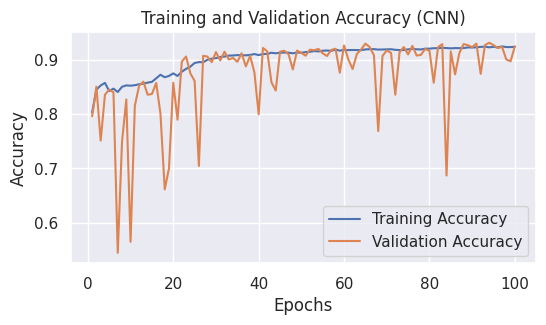

In [30]:
import matplotlib.pyplot as plt

# Extract data from the history object
epochs = range(1, len(history.history['loss']) + 1)
train_accuracy = history.history['accuracy']
train_loss = history.history['loss']
val_accuracy = history.history['val_accuracy']
val_loss = history.history['val_loss']

# Plot training and validation accuracy
plt.figure(figsize=(6, 3))  # Adjust the figure size as needed
plt.plot(epochs, train_accuracy, label='Training Accuracy')
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy (CNN)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='best')  # Automatically place the legend in the best position
plt.grid(True)  # Add grid lines for better readability
plt.show()

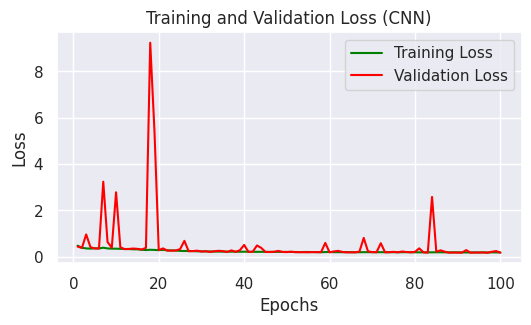

In [31]:
import matplotlib.pyplot as plt

# Extract data from the history object
epochs = range(1, len(history.history['loss']) + 1)
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a figure with appropriate size
plt.figure(figsize=(6, 3))

# Plot training loss in green and validation loss in red
plt.plot(epochs, train_loss, label='Training Loss', color='green')
plt.plot(epochs, val_loss, label='Validation Loss', color='red')

# Set title, labels, and legend
plt.title('Training and Validation Loss (CNN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Add grid lines for better readability
plt.grid(True)

# Show the plot
plt.show()


Conclusion after CNN Training¶
After training our deep CNN model on training data and validating it on validation data, it can be interpreted that:

Model was trained on 50 epochs and then on 30 epochs
CNN performed exceptionally well on training data and the accuracy was 99%
Model accuracy was down to 83.55% on valiadtion data after 50 iterations, and gave a good accuracy of 92% after 30 iterations. Thus, it can be interpreted that optimal number of iterations on which this model can perform are 30.